Let's try to sharpen the images or look at the surrounding area of each pixel to highlight areas that may have an issue. Then let's look at
trying to quantify the noise in each image.

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pathlib
from copy import copy
from matplotlib import cm, colors

paths = pathlib.Path('./OT data 80 um/int').glob('*.tif')
paths_sorted = [x for x in paths]
paths_sorted.sort()

powderthickness = 80
objectinfo = pd.read_csv('Parameters.csv', names=["Object", "P", "S", "H", "Porosity"])
objectinfo.insert(1, "VED", objectinfo.P * 1000/(objectinfo.S * objectinfo.H * powderthickness))
integrals = np.array([np.array(plt.imread(path)) for path in paths_sorted])
del paths_sorted

In [12]:
objectwidth = 83
objectheight = 122
xspacing = 133
yspacing = 270
xstart = 293
ystart = 268
xend = 1730
yend = 1770
objectCoordinates = [[x, x+objectwidth, y, y+objectheight] for y in reversed(range(
    ystart, yend, objectheight + yspacing)) for x in range(xstart, xend, xspacing + objectwidth)]
coorddf = pd.DataFrame(objectCoordinates, columns=['xstart', 'xend', 'ystart', 'yend'])
objectinfo = coorddf.join(objectinfo)
del coorddf
del objectCoordinates
print(objectinfo)


    xstart  xend  ystart  yend Object        VED    P     S     H  Porosity
0      293   376    1444  1566     H1  46.875000  270   800  0.09     0.037
1      509   592    1444  1566     H2  21.634615  270  1200  0.13     4.847
2      725   808    1444  1566     H3  34.090909  300  1000  0.11     0.071
3      941  1024    1444  1566     H4  38.194444  330  1200  0.09     0.046
4     1157  1240    1444  1566     H5  34.090909  300  1000  0.11     0.092
5     1373  1456    1444  1566     H6  39.663462  330   800  0.13     0.049
6     1589  1672    1444  1566     H7  31.250000  270  1200  0.09     0.051
7      293   376    1052  1174     H8  26.442308  330  1200  0.13     1.002
8      509   592    1052  1174     H9  34.090909  300  1000  0.11     0.067
9      725   808    1052  1174    H10  32.451923  270   800  0.13     0.071
10     941  1024    1052  1174    H11  57.291667  330   800  0.09     0.044
11    1157  1240    1052  1174    H12  34.090909  300  1000  0.11     0.105
12    1373  

Let's use the spatial KD approach from the book.

(225, 2000, 2000)
225


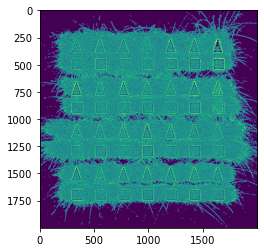

In [14]:
import cv2
# This could also be a gaussian
kernel = np.array([[1, 1, 1],
                   [1, 1, 1],
                   [1, 1, 1]])/9
veryBlurredLayers = np.array([cv2.filter2D(src=image, ddepth=-1, kernel=kernel) for image in integrals])
print(np.shape(veryBlurredLayers))
plt.imshow(integrals[93] - veryBlurredLayers[93])
windowSize = 7
(endLayer, _, _) = veryBlurredLayers.shape
print(endLayer)
# We wanna check for each object...
neighbourhoodValues = np.array([np.sum(veryBlurredLayers[layerIndex-windowSize:layerIndex], axis=0)/windowSize
                               for layerIndex in range(windowSize, endLayer)])
del veryBlurredLayers

In [ ]:
# Initial simple approach

objectinfo['lower_than_0.67'] = 0
objectinfo['lower_than_0.5'] = 0
objectinfo['higher_than_1.5'] = 0
objectinfo['higher_than_2'] = 0
objectinfo['total_1.5'] = 0
objectinfo['total_2'] = 0

layer = 93
for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    #     plt.title("Object " + str(object.Object) + " segment " + str(object.Segment))
    # xs = integrals[windowSize-1:endLayer-1, object.ystart:object.yend,object.xstart:object.xend]
    xs = integrals[windowSize:endLayer,object.ystart:object.yend, object.xstart:object.xend]
    ys = neighbourhoodValues[:, object.ystart:object.yend,object.xstart:object.xend]
    correlation = np.corrcoef(xs.flatten(), ys.flatten())
    ratio = xs/ys
    objectinfo.at[index, 'lower_than_0.67'] = np.count_nonzero((ratio < 1/1.5) & (xs > 4000))
    objectinfo.at[index, 'higher_than_1.5'] = np.count_nonzero((ratio > 1.5) & (xs > 4000))
    objectinfo.at[index, 'lower_than_0.5']  = np.count_nonzero((ratio < 1/2) & (xs > 4000))
    objectinfo.at[index, 'higher_than_2']   = np.count_nonzero((ratio > 2) & (xs > 4000))
    objectinfo.at[index, 'total_1.5']       = np.count_nonzero(((ratio < 1/1.5) | (ratio > 1.5)) & xs > 4000)
    objectinfo.at[index, 'total_2']         = np.count_nonzero(((ratio < 1/2) | (ratio > 2)) & xs > 4000)

    plt.title("Object " + str(object.Object) +
              " porosity " + str(object.Porosity))
    plt.scatter(xs, ys, s=10, alpha=0.025)
    plt.axline((0, 0), (1, 1), linewidth=1, color='g')
    plt.axline((0, 0), (1, 1.5), linewidth=1, color='y')
    plt.axline((0, 0), (1.5, 1), linewidth=1, color='y')
    plt.axline((0, 0), (2, 1), linewidth=1, color='r')
    plt.axline((0, 0), (1, 2), linewidth=1, color='r')
    plt.xlabel("Value")
    plt.ylabel("Neighbourhood value")
    plt.figure()


In [ ]:
plt.scatter(objectinfo['lower_than_0.67'], objectinfo['Porosity'])
plt.title('lower_than_0.67')
plt.yscale('log')
plt.figure()
plt.scatter(objectinfo['lower_than_0.5'], objectinfo['Porosity'])
plt.title('lower_than_0.5')
plt.yscale('log')
plt.figure()
plt.scatter(objectinfo['higher_than_1.5'], objectinfo['Porosity'])
plt.title('higher_than_1.5')
plt.yscale('log')
plt.figure()
plt.scatter(objectinfo['higher_than_2'], objectinfo['Porosity'])
plt.title('higher_than_2')
plt.yscale('log')
plt.figure()
plt.scatter(objectinfo['total_1.5'], objectinfo['Porosity'])
plt.title('total_1.5')
plt.yscale('log')
plt.figure()
plt.scatter(objectinfo['total_2'], objectinfo['Porosity'])
plt.title('total_2')
plt.yscale('log')
plt.figure()


In [ ]:
# Let's color code the dots on an image that fits the bill so to say
image = integrals[93]

# make a copy so we don't mess up system copy
my_cmap = copy(cm.get_cmap('gray'))
my_cmap.set_under('r', alpha=.5)  # make locations over vmax translucent red
my_cmap.set_over('w', alpha=0)   # make location under vmin transparent white
my_cmap.set_bad('w', alpha=0)             # make location with invalid data green

xs = image
ys = neighbourhoodValues[93-windowSize-1]
ratio = xs/ys
# ratio[np.isnan(ratio)] = 0
# ratio[np.isinf(ratio)] = 0
plt.title('lower_than_0.67')
plt.imshow(image)
my_norm = colors.Normalize(vmin=.66, vmax=.67, clip=False)
plt.imshow(ratio, norm=my_norm, cmap=my_cmap, interpolation='nearest')
plt.figure()

plt.title('0.5')
plt.imshow(image)
my_norm = colors.Normalize(vmin=.5, vmax=.51, clip=False)
plt.imshow(ratio, norm=my_norm, cmap=my_cmap, interpolation='nearest')
plt.figure()

my_cmap2 = copy(cm.get_cmap('gray'))
my_cmap2.set_over('r', alpha=.5)  # make locations over vmax translucent red
my_cmap2.set_under('w', alpha=0)   # make location under vmin transparent white
# make location with invalid data green
my_cmap2.set_bad('w', alpha=0)

plt.title('1.5')
plt.imshow(image)
my_norm = colors.Normalize(vmin=1.5, vmax=1.51, clip=False)
plt.imshow(ratio, norm=my_norm, cmap=my_cmap2, interpolation='nearest')
plt.figure()

plt.title('2')
plt.imshow(image)
my_norm = colors.Normalize(vmin=2, vmax=2.01, clip=False)
plt.imshow(ratio, norm=my_norm, cmap=my_cmap2, interpolation='nearest')
plt.figure()


In [ ]:
my_cmap2 = copy(cm.get_cmap('gray'))
my_cmap2.set_over('r', alpha=1)  # make locations over vmax translucent red
my_cmap2.set_under('w', alpha=0)   # make location under vmin transparent white
# make location with invalid data green
my_cmap2.set_bad('w', alpha=0)

plt.title('1.5')
plt.imshow(image)
my_norm = colors.Normalize(vmin=4000, vmax=4001, clip=False)
plt.imshow(image, norm=my_norm, cmap=my_cmap2, interpolation='nearest')
plt.figure()

# 4000 filters noise nicely


In [ ]:
my_cmap2 = copy(cm.get_cmap('gray'))
my_cmap2.set_over('r', alpha=1)  # make locations over vmax translucent red
my_cmap2.set_under('w', alpha=0)   # make location under vmin transparent white
# make location with invalid data green
my_cmap2.set_bad('w', alpha=0)

plt.imshow(image, vmax=10000)
my_norm = colors.Normalize(vmin=5000, vmax=5001, clip=False)
plt.imshow(neighbourhoodValues[93-windowSize-1],
           norm=my_norm, cmap=my_cmap2, interpolation='nearest')
plt.figure()


Let's try this with stddev instead

In [ ]:
for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    #     plt.title("Object " + str(object.Object) + " segment " + str(object.Segment))
    ys = neighbourhoodValues[:, object.ystart:object.yend,
                             object.xstart:object.xend]
    xs = integrals[windowSize:endLayer, object.ystart:object.yend,
                   object.xstart:object.xend]
    correlation = np.corrcoef(xs.flatten(), ys.flatten())
    ratio = xs/ys
    avg = np.average(ratio)
    stddev = np.std(ratio)

    plt.title("Object " + str(object.Object) +
              " porosity " + str(object.Porosity))
    plt.scatter(xs, ys, s=10, alpha=0.025)
    plt.axline((0, 0), (avg, 1), linewidth=1, color='g')
    plt.axline((0, 0), (avg-stddev, 1), linewidth=1, color='y')
    plt.axline((0, 0), (avg+stddev, 1), linewidth=1, color='y')
    plt.axline((0, 0), (avg-(stddev*2), 1), linewidth=1, color='r')
    plt.axline((0, 0), (avg+(stddev*2), 1), linewidth=1, color='r')
    plt.xlabel("Value")
    plt.ylabel("Neighbourhood value")
    # plt.xscale('log')
    # plt.yscale('log')
    plt.figure()

In [ ]:


kernel = np.array([[0, -1, 0],
                   [-1, 5, -1],
                   [0, -1, 0]])
layer = 93
image_sharp = cv2.filter2D(src=integrals[layer], ddepth=-1, kernel=kernel)
ncopy = np.copy(neighbourhoodValues[layer-windowSize-2])
# ncopy[ncopy < 5000] = 0
# image_sharp[ncopy < 5000] = 0

for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    #     plt.title("Object " + str(object.Object) + " segment " + str(object.Segment))
    # xs = integrals[windowSize-1:endLayer-1, object.ystart:object.yend,object.xstart:object.xend]
    xs = image_sharp[object.ystart:object.yend, object.xstart:object.xend]
    ys = ncopy[object.ystart:object.yend,object.xstart:object.xend]
    ratio = xs/ys
    plt.title("Object " + str(object.Object) +
              " porosity " + str(object.Porosity))
    plt.scatter(xs, ys, s=10, alpha=0.125)
    l1 = plt.axline((0, 0), (1, 1), linewidth=1, color='y')
    l2 = plt.axline((0, 0), (1, 1.5), linewidth=1, color='g')
    l3 = plt.axline((0, 0), (1.5, 1), linewidth=1, color='r')
    plt.xlabel("Value")
    plt.ylabel("Average Neighbourhood Value")
    plt.legend([l2,l1,l3],['1 : 1.5','1 : 1','1.5 : 1'],loc="lower right")
    xmin, xmax, ymin, ymax = plt.axis()
    x = np.arange(0,xmax)
    x1 = x/1.5
    x1[x1 > ymax] = ymax
    y = np.arange(0,ymax)
    y1 = y/1.5
    y1[y1 > xmax] = xmax
    plt.fill_between(x, x1, 0, facecolor='r', alpha=0.4)
    plt.fill_betweenx(y, y1, 0, facecolor='g', alpha=0.4)
    plt.figure()
    
    
    plt.imshow(image_sharp[object.ystart:object.yend,
               object.xstart:object.xend], cmap="gray")
    # Start with higher
    my_cmap2 = copy(cm.get_cmap('gray'))
    my_cmap2.set_over('r')  # make locations over vmax translucent red
    my_cmap2.set_under('w', alpha=0)   # make location under vmin transparent white
    # make location with invalid data green
    my_cmap2.set_bad('w', alpha=0)
    my_norm = colors.Normalize(vmin=1.5, vmax=1.5001, clip=False)
    plt.imshow(ratio, norm=my_norm, cmap=my_cmap2, interpolation='nearest')
    # then lower
    my_cmap = copy(cm.get_cmap('gray'))
    my_cmap.set_under('g')  # make locations over vmax translucent red
    # make location under vmin transparent white
    my_cmap.set_over('w', alpha=0)
    # make location with invalid data green
    my_cmap.set_bad('w')
    my_norm = colors.Normalize(vmin=0.6666, vmax=0.6667, clip=False)
    plt.imshow(ratio, norm=my_norm, cmap=my_cmap, interpolation='nearest')
    plt.figure()


Let's remove the points under a certain percentile...

/var/folders/q8/tcfvx04d1y11jv7mj6t996fr0000gn/T/ipykernel_13699/16953589.py:25: RuntimeWarning: invalid value encountered in true_divide
  ratio = xs/ys
/var/folders/q8/tcfvx04d1y11jv7mj6t996fr0000gn/T/ipykernel_13699/16953589.py:80: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


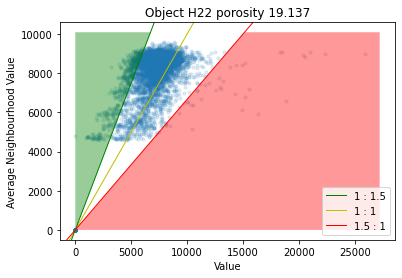

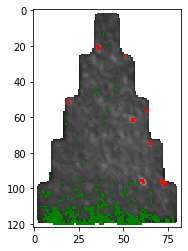

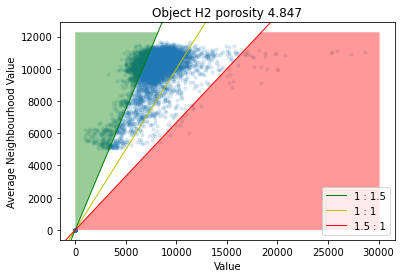

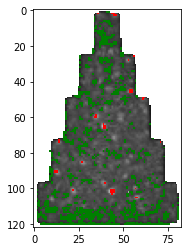

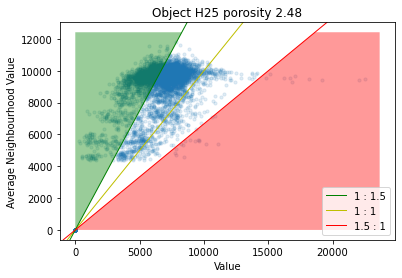

...

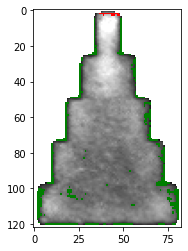

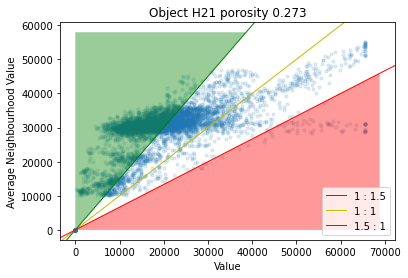

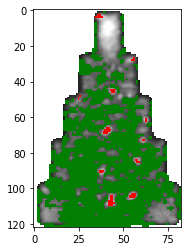

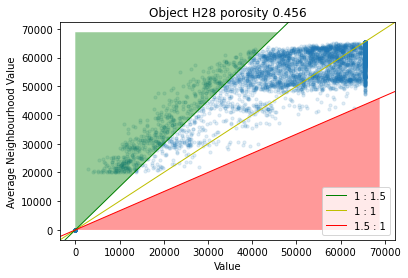

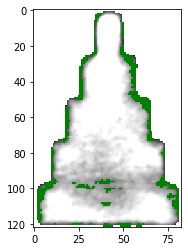

<Figure size 432x288 with 0 Axes>

In [15]:
objectinfo['lower_than_0.67'] = 0
objectinfo['lower_than_0.5'] = 0
objectinfo['higher_than_1.5'] = 0
objectinfo['higher_than_2'] = 0
objectinfo['total_1.5'] = 0
objectinfo['total_2'] = 0

kernel = np.array([[0, -1, 0],
                   [-1, 5, -1],
                   [0, -1, 0]])
layer = 93
image_sharp = cv2.filter2D(src=integrals[layer], ddepth=-1, kernel=kernel)
ncopy = np.copy(neighbourhoodValues[layer-windowSize-2])
# ncopy[ncopy < 5000] = 0
# image_sharp[ncopy < 5000] = 0

for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    #     plt.title("Object " + str(object.Object) + " segment " + str(object.Segment))
    # xs = integrals[windowSize-1:endLayer-1, object.ystart:object.yend,object.xstart:object.xend]
    xs = image_sharp[object.ystart:object.yend, object.xstart:object.xend]
    ys = ncopy[object.ystart:object.yend, object.xstart:object.xend]
    limit = np.percentile(xs, 47)
    xs[ys < limit] = 0
    ys[ys < limit] = 0
    ratio = xs/ys
    objectinfo.at[index, 'lower_than_0.67'] = np.count_nonzero(
        (ratio < 1/1.5) & (xs > limit))
    objectinfo.at[index, 'higher_than_1.5'] = np.count_nonzero(
        (ratio > 1.5) & (xs > limit))
    objectinfo.at[index, 'lower_than_0.5'] = np.count_nonzero(
        (ratio < 1/2) & (xs > limit))
    objectinfo.at[index, 'higher_than_2'] = np.count_nonzero(
        (ratio > 2) & (xs > limit))
    objectinfo.at[index, 'total_1.5'] = np.count_nonzero(
        ((ratio < 1/1.5) | (ratio > 1.5)) & xs > limit)
    objectinfo.at[index, 'total_2'] = np.count_nonzero(
        ((ratio < 1/2) | (ratio > 2)) & xs > limit)
    plt.title("Object " + str(object.Object) +
              " porosity " + str(object.Porosity))
    plt.scatter(xs, ys, s=10, alpha=0.125)
    l1 = plt.axline((0, 0), (1, 1), linewidth=1, color='y')
    l2 = plt.axline((0, 0), (1, 1.5), linewidth=1, color='g')
    l3 = plt.axline((0, 0), (1.5, 1), linewidth=1, color='r')
    plt.xlabel("Value")
    plt.ylabel("Average Neighbourhood Value")
    plt.legend([l2, l1, l3], ['1 : 1.5', '1 : 1',
               '1.5 : 1'], loc="lower right")
    xmin, xmax, ymin, ymax = plt.axis()
    x = np.arange(0, xmax)
    x1 = x/1.5
    x1[x1 > ymax] = ymax
    y = np.arange(0, ymax)
    y1 = y/1.5
    y1[y1 > xmax] = xmax
    plt.fill_between(x, x1, 0, facecolor='r', alpha=0.4)
    plt.fill_betweenx(y, y1, 0, facecolor='g', alpha=0.4)
    plt.figure()

    plt.imshow(image_sharp[object.ystart:object.yend,
               object.xstart:object.xend], cmap="gray")
    
    # Start with higher
    my_cmap2 = copy(cm.get_cmap('gray'))
    my_cmap2.set_over('r')  # make locations over vmax translucent red
    # make location under vmin transparent white
    my_cmap2.set_under('w', alpha=0)
    # make location with invalid data green
    my_cmap2.set_bad('w', alpha=0)
    my_norm = colors.Normalize(vmin=1.5, vmax=1.5001, clip=False)
    plt.imshow(ratio, norm=my_norm, cmap=my_cmap2, interpolation='nearest')
    # then lower
    my_cmap = copy(cm.get_cmap('gray'))
    my_cmap.set_under('g')  # make locations over vmax translucent red
    # make location under vmin transparent white
    my_cmap.set_over('w', alpha=0)
    # make location with invalid data green
    my_cmap.set_bad('w')
    my_norm = colors.Normalize(vmin=0.6666, vmax=0.6667, clip=False)
    plt.imshow(ratio, norm=my_norm, cmap=my_cmap, interpolation='nearest')
    plt.figure()


In [ ]:
objectinfo['lower_than_0.67'] = 0
objectinfo['lower_than_0.5'] = 0
objectinfo['higher_than_1.5'] = 0
objectinfo['higher_than_2'] = 0
objectinfo['total_1.5'] = 0
objectinfo['total_2'] = 0
objectinfo['no_of_points'] = 0

for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    #     plt.title("Object " + str(object.Object) + " segment " + str(object.Segment))
    # xs = integrals[windowSize-1:endLayer-1, object.ystart:object.yend,object.xstart:object.xend]
    xs = integrals[windowSize-2:endLayer-2,object.ystart:object.yend, object.xstart:object.xend]
    ys = neighbourhoodValues[:, object.ystart:object.yend,object.xstart:object.xend]
    ratio = xs/ys
    
    objectinfo.at[index, 'no_of_points'] = np.count_nonzero((xs > 5000))
    objectinfo.at[index, 'lower_than_0.67'] = np.count_nonzero(
        (ratio < 1/1.5) & (xs > 5000))
    objectinfo.at[index, 'higher_than_1.5'] = np.count_nonzero(
        (ratio > 1.5) & (xs > 5000))
    objectinfo.at[index, 'lower_than_0.5'] = np.count_nonzero(
        (ratio < 1/2) & (xs > 5000))
    objectinfo.at[index, 'higher_than_2'] = np.count_nonzero(
        (ratio > 2) & (xs > 5000))
    objectinfo.at[index, 'total_1.5'] = np.count_nonzero(
        ((ratio < 1/1.5) | (ratio > 1.5)) & (xs > 5000))
    objectinfo.at[index, 'total_2'] = np.count_nonzero(
        ((ratio < 1/2) | (ratio > 2)) & (xs > 5000))

plt.scatter(objectinfo['lower_than_0.67']/objectinfo['no_of_points'],
            objectinfo['Porosity'], c='g', s=20, alpha=0.6, label='<= 1:1.5')
plt.scatter(objectinfo['higher_than_1.5']/objectinfo['no_of_points'],
            objectinfo['Porosity'], c='r', s=20, alpha=0.6, label='>= 1.5:1')
for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    xs = [object['lower_than_0.67']/object['no_of_points'],
          object['higher_than_1.5']/object['no_of_points']]
    ys = [object['Porosity'], object['Porosity']]
    plt.plot(xs, ys, linestyle='--', color='b', alpha=0.2)
plt.title('Ratio of outliers to porosity')
plt.legend()
plt.ylabel('Porosity')
plt.xlabel('Rate of outliers')
plt.yscale('log')


/var/folders/q8/tcfvx04d1y11jv7mj6t996fr0000gn/T/ipykernel_13699/1240254189.py:17: RuntimeWarning: invalid value encountered in true_divide
  ratio = xs/ys


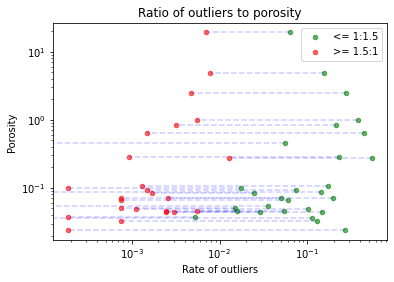

In [21]:
# Counts and prints a scatter plot of all

objectinfo['lower_than_0.67'] = 0
objectinfo['lower_than_0.5'] = 0
objectinfo['higher_than_1.5'] = 0
objectinfo['higher_than_2'] = 0
objectinfo['total_1.5'] = 0
objectinfo['total_2'] = 0
objectinfo['no_of_points'] = 0

for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    xs = image_sharp[object.ystart:object.yend, object.xstart:object.xend]
    ys = ncopy[object.ystart:object.yend, object.xstart:object.xend]
    limit = np.percentile(xs, 47)
    xs[ys < limit] = 0
    ys[ys < limit] = 0
    ratio = xs/ys
    objectinfo.at[index, 'no_of_points'] = np.count_nonzero((xs > limit))
    objectinfo.at[index, 'lower_than_0.67'] = np.count_nonzero(
        (ratio < 1/1.5) & (xs > limit))
    objectinfo.at[index, 'higher_than_1.5'] = np.count_nonzero(
        (ratio > 1.5) & (xs > limit))
    objectinfo.at[index, 'lower_than_0.5'] = np.count_nonzero(
        (ratio < 1/2) & (xs > limit))
    objectinfo.at[index, 'higher_than_2'] = np.count_nonzero(
        (ratio > 2) & (xs > limit))
    objectinfo.at[index, 'total_1.5'] = np.count_nonzero(
        ((ratio < 1/1.5) | (ratio > 1.5)) & xs > limit)
    objectinfo.at[index, 'total_2'] = np.count_nonzero(
        ((ratio < 1/2) | (ratio > 2)) & xs > limit)

plt.scatter(objectinfo['lower_than_0.67']/objectinfo['no_of_points'],
            objectinfo['Porosity'], c='g', s=20, alpha=0.6, label='<= 1:1.5')
plt.scatter(objectinfo['higher_than_1.5']/objectinfo['no_of_points'],
            objectinfo['Porosity'], c='r', s=20, alpha=0.6, label='>= 1.5:1')
for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    xs = [object['lower_than_0.67']/object['no_of_points'],
          object['higher_than_1.5']/object['no_of_points']]
    ys = [object['Porosity'], object['Porosity']]
    plt.plot(xs, ys, linestyle='--', color='b', alpha=0.2)
plt.title('Ratio of outliers to porosity')
plt.legend()
plt.ylabel('Porosity')
plt.xlabel('Rate of outliers')
plt.yscale('log')
plt.xscale('log')

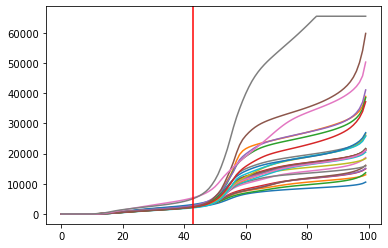

In [18]:
# let's see where a suitable cut may happen
xs = np.arange(0, 100)
for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    plt.plot(xs, np.percentile(integrals[windowSize-2:endLayer-2,object.ystart:object.yend, object.xstart:object.xend], xs))
plt.axvline(x=43, color='r', linestyle='-')
    

/var/folders/q8/tcfvx04d1y11jv7mj6t996fr0000gn/T/ipykernel_13699/1735022815.py:18: RuntimeWarning: invalid value encountered in true_divide
  ratio = xs/ys
/var/folders/q8/tcfvx04d1y11jv7mj6t996fr0000gn/T/ipykernel_13699/1735022815.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


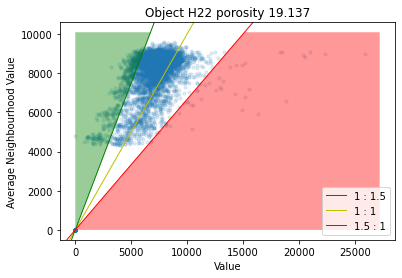

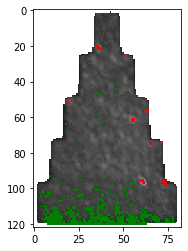

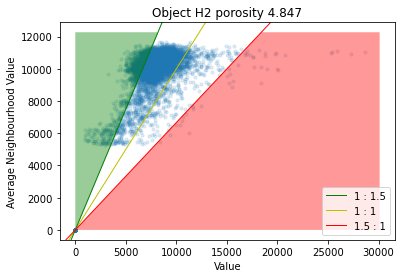

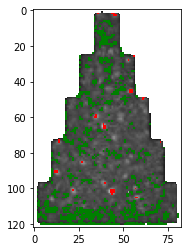

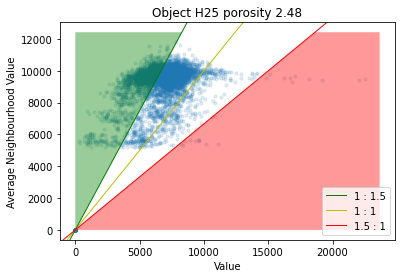

...

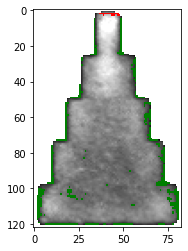

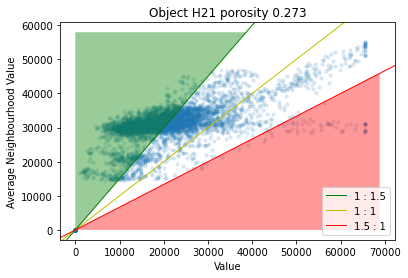

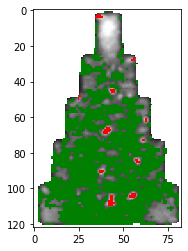

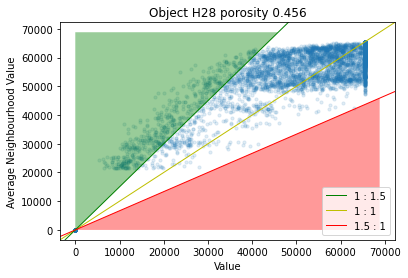

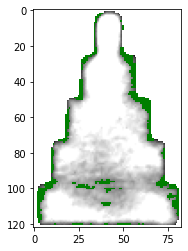

<Figure size 432x288 with 0 Axes>

In [16]:
# Let's look at cutting the minimum 44% instead

kernel = np.array([[0, -1, 0],
                   [-1, 5, -1],
                   [0, -1, 0]])
layer = 93
image_sharp = cv2.filter2D(src=integrals[layer], ddepth=-1, kernel=kernel)
ncopy = np.copy(neighbourhoodValues[layer-windowSize-2])

for index, object in objectinfo.sort_values(by=['VED']).iterrows():
    #     plt.title("Object " + str(object.Object) + " segment " + str(object.Segment))
    # xs = integrals[windowSize-1:endLayer-1, object.ystart:object.yend,object.xstart:object.xend]
    xs = image_sharp[object.ystart:object.yend, object.xstart:object.xend]
    ys = ncopy[object.ystart:object.yend, object.xstart:object.xend]
    cut_limit = np.percentile(ys, 44)
    xs[ys < cut_limit] = 0
    ys[ys < cut_limit] = 0
    ratio = xs/ys
    plt.title("Object " + str(object.Object) +
              " porosity " + str(object.Porosity))
    plt.scatter(xs, ys, s=10, alpha=0.125)
    l1 = plt.axline((0, 0), (1, 1), linewidth=1, color='y')
    l2 = plt.axline((0, 0), (1, 1.5), linewidth=1, color='g')
    l3 = plt.axline((0, 0), (1.5, 1), linewidth=1, color='r')
    plt.xlabel("Value")
    plt.ylabel("Average Neighbourhood Value")
    plt.legend([l2, l1, l3], ['1 : 1.5', '1 : 1',
               '1.5 : 1'], loc="lower right")
    xmin, xmax, ymin, ymax = plt.axis()
    x = np.arange(0, xmax)
    x1 = x/1.5
    x1[x1 > ymax] = ymax
    y = np.arange(0, ymax)
    y1 = y/1.5
    y1[y1 > xmax] = xmax
    plt.fill_between(x, x1, 0, facecolor='r', alpha=0.4)
    plt.fill_betweenx(y, y1, 0, facecolor='g', alpha=0.4)
    plt.figure()

    plt.imshow(image_sharp[object.ystart:object.yend,
               object.xstart:object.xend], cmap="gray")
    # Start with higher
    my_cmap2 = copy(cm.get_cmap('gray'))
    my_cmap2.set_over('r')  # make locations over vmax translucent red
    # make location under vmin transparent white
    my_cmap2.set_under('w', alpha=0)
    # make location with invalid data green
    my_cmap2.set_bad('w', alpha=0)
    my_norm = colors.Normalize(vmin=1.5, vmax=1.5001, clip=False)
    plt.imshow(ratio, norm=my_norm, cmap=my_cmap2, interpolation='nearest')
    # then lower
    my_cmap = copy(cm.get_cmap('gray'))
    my_cmap.set_under('g')  # make locations over vmax translucent red
    # make location under vmin transparent white
    my_cmap.set_over('w', alpha=0)
    # make location with invalid data green
    my_cmap.set_bad('w')
    my_norm = colors.Normalize(vmin=0.6666, vmax=0.6667, clip=False)
    plt.imshow(ratio, norm=my_norm, cmap=my_cmap, interpolation='nearest')
    plt.figure()


/var/folders/q8/tcfvx04d1y11jv7mj6t996fr0000gn/T/ipykernel_13699/3771722932.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


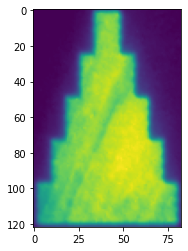

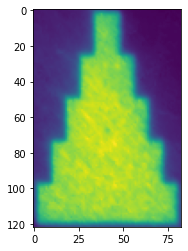

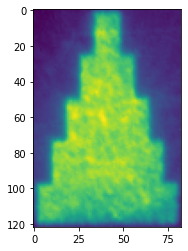

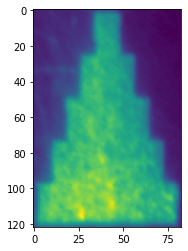

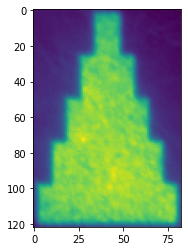

...

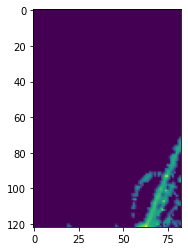

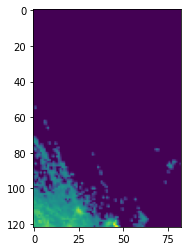

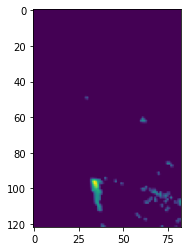

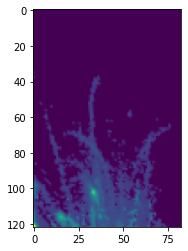

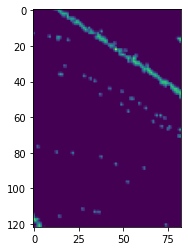

<Figure size 432x288 with 0 Axes>

In [17]:
objectinfo['lower_than_0.67'] = 0
objectinfo['lower_than_0.5'] = 0
objectinfo['higher_than_1.5'] = 0
objectinfo['higher_than_2'] = 0
objectinfo['total_1.5'] = 0
objectinfo['total_2'] = 0

kernel = np.array([[0, -1, 0],
                   [-1, 5, -1],
                   [0, -1, 0]])

image_sharp = cv2.filter2D(src=integrals[layer], ddepth=-1, kernel=kernel)
ncopy = np.copy(neighbourhoodValues[layer-windowSize-2])
# ncopy[ncopy < 5000] = 0
# image_sharp[ncopy < 5000] = 0
object = objectinfo.iloc[21]

for layer in integrals:
    plt.imshow(layer[object.ystart:object.yend,
               object.xstart:object.xend])
    plt.figure()
